In [1]:
import numpy as np
import matplotlib.pyplot as plt

# KNN Implementation using numpy

In [82]:
def predict(X, y, test_point, k=3):
    # compute distance
    distance = ((X - test_point)**2).sum(axis=1)**0.5
    knn_indexes = np.argsort(distance)[:k] # indices of k nearest neighbour

    # get the category of my NN
    knn_cat = y[knn_indexes]
    cls, count = np.unique(knn_cat, return_counts=True)
    # d = {key:v for key, v in zip(cls, count)}
    # print(d)

    max_count_idx = np.argmax(count)
    pred_cat = cls[max_count_idx] # category with maximum count

    return pred_cat

def accuracy(ypred, ytrue):
    return (ypred==ytrue).mean()

In [18]:
d = np.array([5, 4, 3, 20, 1])
np.argmax(d) # returns the index of max element

3

In [15]:
d = np.array([5, 4, 3, 2, 1])
print(np.sort(d))
np.argsort(d)[:3]

[1 2 3 4 5]


array([4, 3, 2], dtype=int64)

In [17]:
a = [0,0,1,1,1,2,2]
np.unique(a, return_counts=True)

(array([0, 1, 2]), array([2, 3, 2], dtype=int64))

## Load Data 

In [3]:
X = np.load("..\data\knn\classification\X_data.npy")
y = np.load("..\data\knn\classification\y_data.npy")

In [4]:
print(X.shape, y.shape)

(500, 2) (500,)


[0 1 2]
[array([0.92156863, 0.25098039, 0.20392157]), array([0.92156863, 0.5372549 , 0.20392157]), array([0.92156863, 0.23921569, 0.38823529])]
{0: array([0.92156863, 0.25098039, 0.20392157]), 1: array([0.92156863, 0.5372549 , 0.20392157]), 2: array([0.92156863, 0.23921569, 0.38823529])}


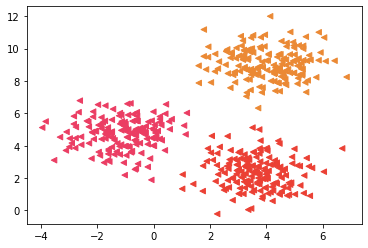

In [40]:
uni_categories = np.unique(y)
print(uni_categories)


colors = [[235, 64, 52], [235, 137, 52], [235, 61, 99]]
colors = [np.array(c)/255 for c in colors] # rgb values should be in 0-1 range
print(colors)

# creating a color map for our categories
d = {} # map of cat: color
i = 0
for cat in uni_categories:
    d[cat] = colors[i]
    i += 1
print(d)

colors = [d[cat] for cat in y] # created a list of colors

feature1, feature2 = X[:,0], X[:,1]
plt.scatter(feature1, feature2, c=colors, s=30, marker="<")
plt.show()

{2: 3}
Predicted category:  2


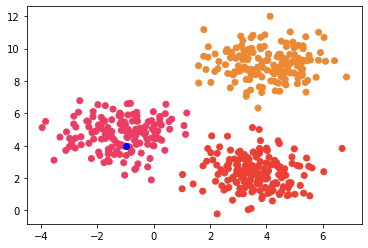

In [50]:
test_point = [-1, 4]
print("Predicted category: ",predict(X, y , test_point))
plt.scatter(feature1, feature2, c=colors)
plt.scatter(test_point[0], test_point[1], c="blue")
plt.show()

## Split given data (X) into train (80%) and test data(20%)

In [70]:
X.shape

idx = np.arange(0, len(X))
train_idx = np.random.choice(idx, size=int(len(X)*0.8), replace=False)
print(train_idx.shape)

test_idx = np.array([i for i in idx if i not in train_idx])
print(len(test_idx))

# test_idx = []
# for i in idx:
#     flag = False
#     for j in train_idx:
#         if j==i:
#             flag = True
#             break
#     if flag == False:
#         test_idx.append(i)
#     else:
#         flag = False

    # if i not in train_idx:
        # test_idx.append(i)


(400,)
100


In [73]:
train_idx[0]
X[[155, 200]], y[[155, 200]]

(array([[-1.85931648,  5.74989098],
        [ 3.97784808,  2.03895155]]),
 array([2, 0]))

In [74]:
X_train, y_train = X[train_idx], y[train_idx]
X_test, y_test = X[test_idx], y[test_idx]

In [75]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(400, 2) (400,)
(100, 2) (100,)


In [83]:
ypred = []
for each_point in X_test:
    pred = predict(X_train, y_train, each_point, k=3)
    ypred.append(pred)

ypred = np.array(ypred)
print(f"Test data accuracy:", accuracy(ypred, y_test))

Test data accuracy: 1.0


## Testing KNN model on data with overlapping features

In [84]:
# pip install scikit-learn
from sklearn.datasets import make_blobs

In [94]:
X, y = make_blobs(500, 2, random_state=0)

(500, 2) (500,)
[0 1 2]


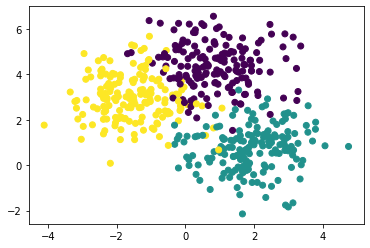

In [95]:
print(X.shape, y.shape)
print(np.unique(y))
plt.scatter(X[:,0], X[:,1], c=y)

In [96]:
# get random indexes for train and test data
idx = np.arange(0, len(X))
train_idx = np.random.choice(idx, size=int(len(X)*0.8), replace=False)
print(train_idx.shape)

test_idx = np.array([i for i in idx if i not in train_idx])
print(len(test_idx))

# split data
X_train, y_train = X[train_idx], y[train_idx]
X_test, y_test = X[test_idx], y[test_idx]

(400,)
100


In [97]:
# Predict on test data samples
ypred = []
for each_point in X_test:
    pred = predict(X_train, y_train, each_point, k=3)
    ypred.append(pred)

ypred = np.array(ypred)
print(f"Test data accuracy:", accuracy(ypred, y_test))

Test data accuracy: 0.91


# How to decide k
k should have a value which gives maximum accuracy

In [100]:
ks = [1, 3, 5, 10, 30, 50, 100, 150, 200, 300, 400]
test_acc = []
train_acc = []
for k in ks:
    # test data
    ypred = []
    for each_point in X_test:
        pred = predict(X_train, y_train, each_point, k)
        ypred.append(pred)
    ypred = np.array(ypred)
    test_acc.append(accuracy(ypred, y_test))
    

    # train data
    ypred2 = []
    for each_point in X_train:
        pred = predict(X_train, y_train, each_point, k)
        ypred2.append(pred) 
    ypred2 = np.array(ypred2)
    train_acc.append(accuracy(ypred2, y_train))
    print(f"k: {k}, Test accuracy: {accuracy(ypred, y_test)}, Training accuracy: {accuracy(ypred2, y_train)}")
print(test_acc)
print(train_acc)

k: 1, Test accuracy: 0.92, Training accuracy: 1.0
k: 3, Test accuracy: 0.91, Training accuracy: 0.96
k: 5, Test accuracy: 0.92, Training accuracy: 0.945
k: 10, Test accuracy: 0.93, Training accuracy: 0.935
k: 30, Test accuracy: 0.9, Training accuracy: 0.94
k: 50, Test accuracy: 0.93, Training accuracy: 0.9375
k: 100, Test accuracy: 0.91, Training accuracy: 0.94
k: 150, Test accuracy: 0.88, Training accuracy: 0.94
k: 200, Test accuracy: 0.89, Training accuracy: 0.94
k: 300, Test accuracy: 0.79, Training accuracy: 0.8325
k: 400, Test accuracy: 0.29, Training accuracy: 0.345
[0.92, 0.91, 0.92, 0.93, 0.9, 0.93, 0.91, 0.88, 0.89, 0.79, 0.29]
[1.0, 0.96, 0.945, 0.935, 0.94, 0.9375, 0.94, 0.94, 0.94, 0.8325, 0.345]


## plot accuracy vs k graph

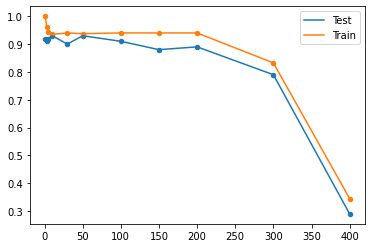

In [108]:

plt.scatter(ks, test_acc, s=20)
plt.plot(ks, test_acc, label="Test")

plt.scatter(ks, train_acc, s=20)
plt.plot(ks, train_acc, label="Train")

plt.legend()
plt.show()

## Decision boundary variation with k

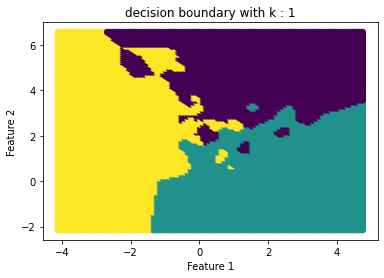

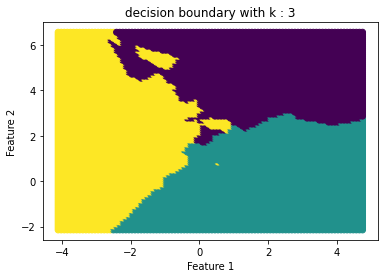

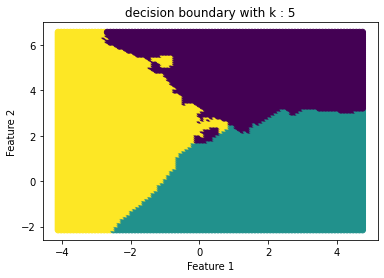

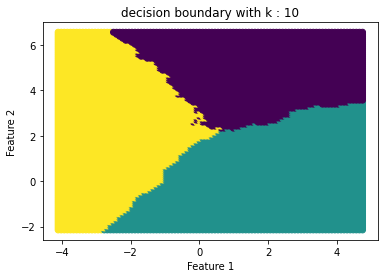

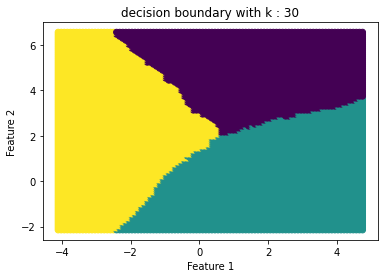

...

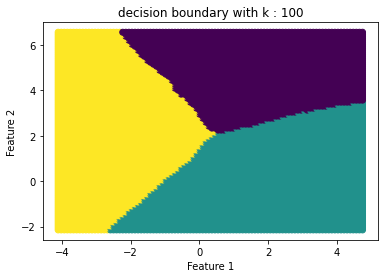

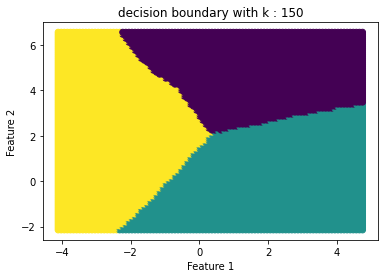

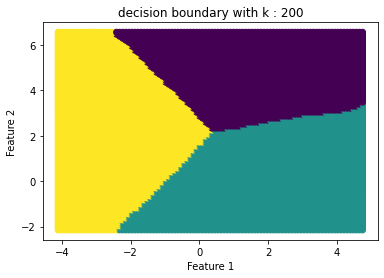

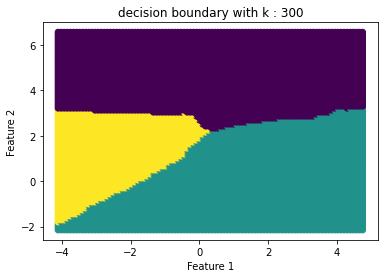

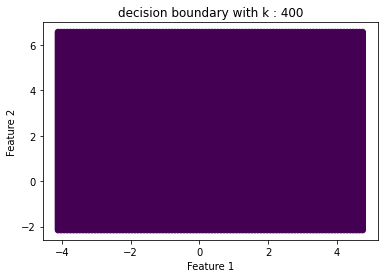

In [111]:

feature_1 = X_train[:,0]
feature_2 = X_train[:,1]

for k in ks:
    f1 = np.linspace(feature_1.min(), feature_1.max(), 100)
    f2 = np.linspace(feature_2.min(), feature_2.max(), 100)

    f1, f2 = np.meshgrid(f1, f2)

    f1 = f1.flatten()
    f2 = f2.flatten()

    pred = []
    for tp1, tp2 in zip(f1, f2):
        pred.append(predict(X_train, y_train, [tp1,tp2], k))

    plt.scatter(f1, f2, c=pred)
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.title(f"decision boundary with k : {k}")
    plt.show()

k: Hyperparameter: set by the user  
Parameter: model learns from the training data

## Cons of KNN:
1. Non-parametric algorithm: we need to load the training data for every prediction
2. Slow
3. Reduced accuracy if Overlapping classes are present in given feature space 

In [62]:
a = np.arange(0, 5)
print(a)
np.random.choice(a, size=3, replace=True)

[0 1 2 3 4]


array([4, 2, 3])

In [6]:
test_point = [4,3]
x = X[0:5] 

In [7]:
print(x, test_point)

[[-3.54122245  3.10356106]
 [ 3.03469932  1.02382996]
 [ 2.09934302  3.11614107]
 [ 6.04308149  2.39113609]
 [ 3.5292764   2.35276246]] [4, 3]


In [12]:
((x - test_point)**2).sum(axis=1)**0.5

array([7.5419335 , 2.19933022, 1.90420212, 2.13187646, 0.80031065])

In [ ]:
# 1e+01 = 10^1